In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler 
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import warnings
warnings.filterwarnings("ignore")

In [2]:
df=pd.read_csv("housing_data.csv")
df

,Unnamed: 0,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,SC60,RL,65,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,1,SC20,RL,80,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,May,2007,WD,Normal,181500
2,2,SC60,RL,68,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Sep,2008,WD,Normal,223500
3,3,SC70,RL,60,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Feb,2006,WD,Abnorml,140000
4,4,SC60,RL,84,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Dec,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1455,SC60,RL,62,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Aug,2007,WD,Normal,175000
1456,1456,SC20,RL,85,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,No,MnPrv,No,0,Feb,2010,WD,Normal,210000
1457,1457,SC70,RL,66,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,No,GdPrv,Shed,2500,May,2010,WD,Normal,266500
1458,1458,SC20,RL,68,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Apr,2010,WD,Normal,142125


In [3]:
print(df.head())  # View the first few rows of the dataframe
print(df.info()) 

   Unnamed: 0 MSSubClass MSZoning  LotFrontage  LotArea Street Alley LotShape  \
0           0       SC60       RL           65     8450   Pave   NaN      Reg   
1           1       SC20       RL           80     9600   Pave   NaN      Reg   
2           2       SC60       RL           68    11250   Pave   NaN      IR1   
3           3       SC70       RL           60     9550   Pave   NaN      IR1   
4           4       SC60       RL           84    14260   Pave   NaN      IR1   

  LandContour Utilities  ... PoolArea PoolQC Fence MiscFeature MiscVal MoSold  \
0         Lvl    AllPub  ...        0     No    No          No       0    Feb   
1         Lvl    AllPub  ...        0     No    No          No       0    May   
2         Lvl    AllPub  ...        0     No    No          No       0    Sep   
3         Lvl    AllPub  ...        0     No    No          No       0    Feb   
4         Lvl    AllPub  ...        0     No    No          No       0    Dec   

  YrSold  SaleType  SaleCo

In [4]:
missing_values = df.isnull().sum()
print(missing_values[missing_values > 0])

Alley          1369
MasVnrType      872
Electrical        1
GarageYrBlt      81
dtype: int64


In [5]:
numerical_cols = df.select_dtypes(include=['float64', 'int64']).columns
df[numerical_cols] = df[numerical_cols].apply(lambda x: x.fillna(x.median()), axis=0)

In [6]:
df[numerical_cols]

,Unnamed: 0,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,YrSold,SalePrice
0,0,65,8450,7,5,2003,2003,196,706,0,...,548,0,61,0,0,0,0,0,2008,208500
1,1,80,9600,6,8,1976,1976,0,978,0,...,460,298,0,0,0,0,0,0,2007,181500
2,2,68,11250,7,5,2001,2002,162,486,0,...,608,0,42,0,0,0,0,0,2008,223500
3,3,60,9550,7,5,1915,1970,0,216,0,...,642,0,35,272,0,0,0,0,2006,140000
4,4,84,14260,8,5,2000,2000,350,655,0,...,836,192,84,0,0,0,0,0,2008,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1455,62,7917,6,5,1999,2000,0,0,0,...,460,0,40,0,0,0,0,0,2007,175000
1456,1456,85,13175,6,6,1978,1988,119,790,163,...,500,349,0,0,0,0,0,0,2010,210000
1457,1457,66,9042,7,9,1941,2006,0,275,0,...,252,0,60,0,0,0,0,2500,2010,266500
1458,1458,68,9717,5,6,1950,1996,0,49,1029,...,240,366,0,112,0,0,0,0,2010,142125


In [7]:
numerical_cols = df.select_dtypes(include=['number']).columns.to_list()
categorical_cols = df.select_dtypes(include=['object']).columns.to_list()

In [8]:
categorical_cols = df.select_dtypes(include=['object']).columns
df[categorical_cols] = df[categorical_cols].apply(lambda x: x.fillna('Unknown'))

In [9]:
df[categorical_cols] 

,MSSubClass,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,...,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,MoSold,SaleType,SaleCondition
0,SC60,RL,Pave,Unknown,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,...,RFn,TA,TA,Y,No,No,No,Feb,WD,Normal
1,SC20,RL,Pave,Unknown,Reg,Lvl,AllPub,FR2,Gtl,Veenker,...,RFn,TA,TA,Y,No,No,No,May,WD,Normal
2,SC60,RL,Pave,Unknown,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,...,RFn,TA,TA,Y,No,No,No,Sep,WD,Normal
3,SC70,RL,Pave,Unknown,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,...,Unf,TA,TA,Y,No,No,No,Feb,WD,Abnorml
4,SC60,RL,Pave,Unknown,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,...,RFn,TA,TA,Y,No,No,No,Dec,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,SC60,RL,Pave,Unknown,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,...,RFn,TA,TA,Y,No,No,No,Aug,WD,Normal
1456,SC20,RL,Pave,Unknown,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,...,Unf,TA,TA,Y,No,MnPrv,No,Feb,WD,Normal
1457,SC70,RL,Pave,Unknown,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,...,RFn,TA,TA,Y,No,GdPrv,Shed,May,WD,Normal
1458,SC20,RL,Pave,Unknown,Reg,Lvl,AllPub,Inside,Gtl,NAmes,...,Unf,TA,TA,Y,No,No,No,Apr,WD,Normal


In [10]:
df.isnull().sum()

Unnamed: 0       0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
                ..
MoSold           0
YrSold           0
SaleType         0
SaleCondition    0
SalePrice        0
Length: 81, dtype: int64

In [11]:
df = df.drop_duplicates()
df

,Unnamed: 0,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,SC60,RL,65,8450,Pave,Unknown,Reg,Lvl,AllPub,...,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,1,SC20,RL,80,9600,Pave,Unknown,Reg,Lvl,AllPub,...,0,No,No,No,0,May,2007,WD,Normal,181500
2,2,SC60,RL,68,11250,Pave,Unknown,IR1,Lvl,AllPub,...,0,No,No,No,0,Sep,2008,WD,Normal,223500
3,3,SC70,RL,60,9550,Pave,Unknown,IR1,Lvl,AllPub,...,0,No,No,No,0,Feb,2006,WD,Abnorml,140000
4,4,SC60,RL,84,14260,Pave,Unknown,IR1,Lvl,AllPub,...,0,No,No,No,0,Dec,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1455,SC60,RL,62,7917,Pave,Unknown,Reg,Lvl,AllPub,...,0,No,No,No,0,Aug,2007,WD,Normal,175000
1456,1456,SC20,RL,85,13175,Pave,Unknown,Reg,Lvl,AllPub,...,0,No,MnPrv,No,0,Feb,2010,WD,Normal,210000
1457,1457,SC70,RL,66,9042,Pave,Unknown,Reg,Lvl,AllPub,...,0,No,GdPrv,Shed,2500,May,2010,WD,Normal,266500
1458,1458,SC20,RL,68,9717,Pave,Unknown,Reg,Lvl,AllPub,...,0,No,No,No,0,Apr,2010,WD,Normal,142125


In [12]:
# Convert categorical variables using one-hot encoding or label encoding if necessary
df = pd.get_dummies(df, columns=categorical_cols)

In [13]:
df

,Unnamed: 0,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,0,65,8450,7,5,2003,2003,196,706,0,...,False,False,False,True,False,False,False,False,True,False
1,1,80,9600,6,8,1976,1976,0,978,0,...,False,False,False,True,False,False,False,False,True,False
2,2,68,11250,7,5,2001,2002,162,486,0,...,False,False,False,True,False,False,False,False,True,False
3,3,60,9550,7,5,1915,1970,0,216,0,...,False,False,False,True,True,False,False,False,False,False
4,4,84,14260,8,5,2000,2000,350,655,0,...,False,False,False,True,False,False,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1455,62,7917,6,5,1999,2000,0,0,0,...,False,False,False,True,False,False,False,False,True,False
1456,1456,85,13175,6,6,1978,1988,119,790,163,...,False,False,False,True,False,False,False,False,True,False
1457,1457,66,9042,7,9,1941,2006,0,275,0,...,False,False,False,True,False,False,False,False,True,False
1458,1458,68,9717,5,6,1950,1996,0,49,1029,...,False,False,False,True,False,False,False,False,True,False


In [14]:
df.to_csv('Cleaned_Data.csv', index=False)

In [15]:
scaler = StandardScaler()

In [16]:
df[numerical_cols] = scaler.fit_transform(df[numerical_cols])

In [17]:
df[numerical_cols]

,Unnamed: 0,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,YrSold,SalePrice
0,-1.730865,0.212877,-0.207142,0.651479,-0.517200,1.050994,0.878668,0.514104,0.575425,-0.288653,...,0.351000,-0.752176,0.216503,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,0.138777,0.347273
1,-1.728492,0.645747,-0.091886,-0.071836,2.179628,0.156734,-0.429577,-0.570750,1.171992,-0.288653,...,-0.060731,1.626195,-0.704483,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,-0.614439,0.007288
2,-1.726120,0.299451,0.073480,0.651479,-0.517200,0.984752,0.830215,0.325915,0.092907,-0.288653,...,0.631726,-0.752176,-0.070361,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,0.138777,0.536154
3,-1.723747,0.068587,-0.096897,0.651479,-0.517200,-1.863632,-0.720298,-0.570750,-0.499274,-0.288653,...,0.790804,-0.752176,-0.176048,4.092524,-0.116339,-0.270208,-0.068692,-0.087688,-1.367655,-0.515281
4,-1.721374,0.761179,0.375148,1.374795,-0.517200,0.951632,0.733308,1.366489,0.463568,-0.288653,...,1.698485,0.780197,0.563760,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,0.138777,0.869843
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1.721374,0.126303,-0.260560,-0.071836,-0.517200,0.918511,0.733308,-0.570750,-0.973018,-0.288653,...,-0.060731,-0.752176,-0.100558,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,-0.614439,-0.074560
1456,1.723747,0.790037,0.266407,-0.071836,0.381743,0.222975,0.151865,0.087911,0.759659,0.722112,...,0.126420,2.033231,-0.704483,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,1.645210,0.366161
1457,1.726120,0.241735,-0.147810,0.651479,3.078570,-1.002492,1.024029,-0.570750,-0.369871,-0.288653,...,-1.033914,-0.752176,0.201405,-0.359325,-0.116339,-0.270208,-0.068692,4.953112,1.645210,1.077611
1458,1.728492,0.299451,-0.080160,-0.795151,0.381743,-0.704406,0.539493,-0.570750,-0.865548,6.092188,...,-1.090059,2.168910,-0.704483,1.473789,-0.116339,-0.270208,-0.068692,-0.087688,1.645210,-0.488523


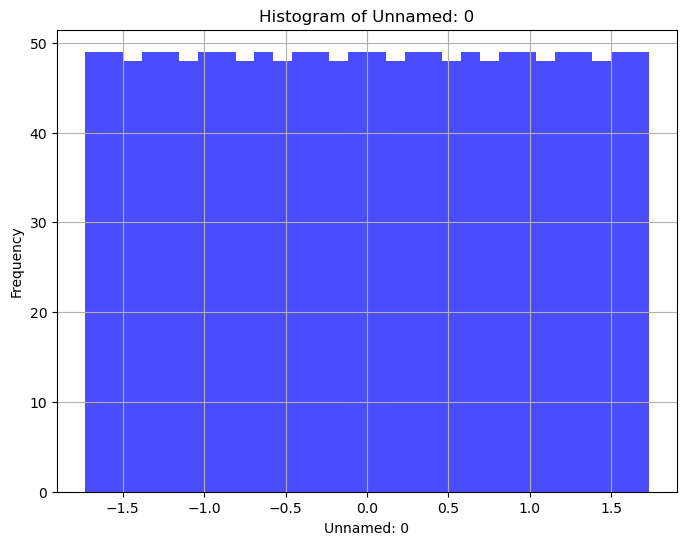

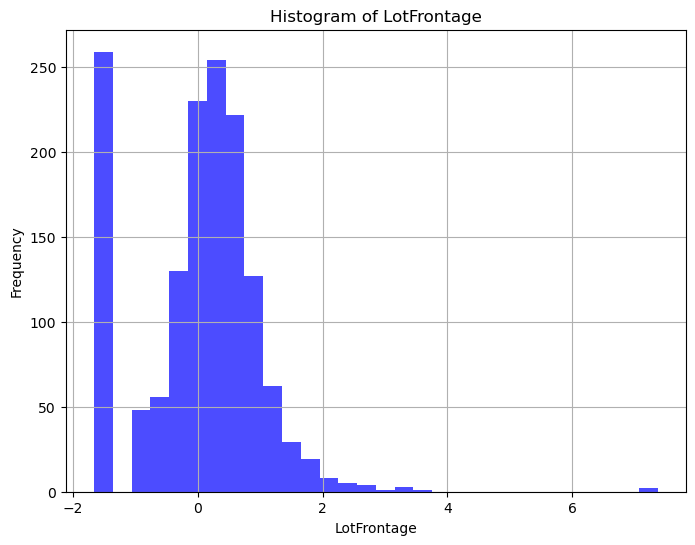

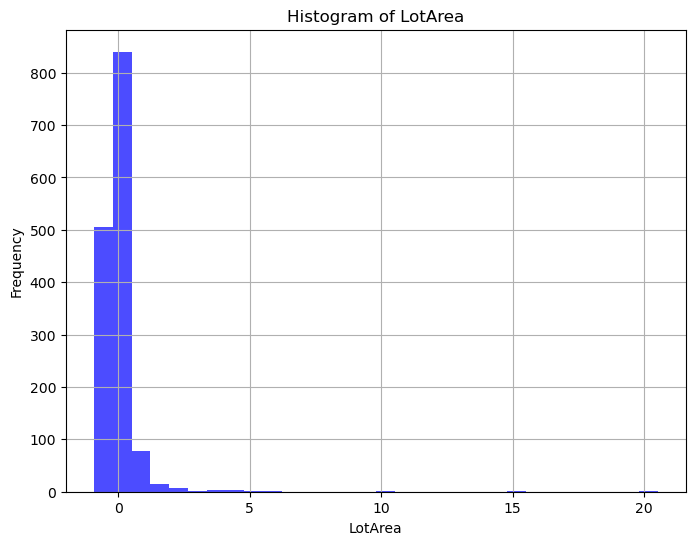

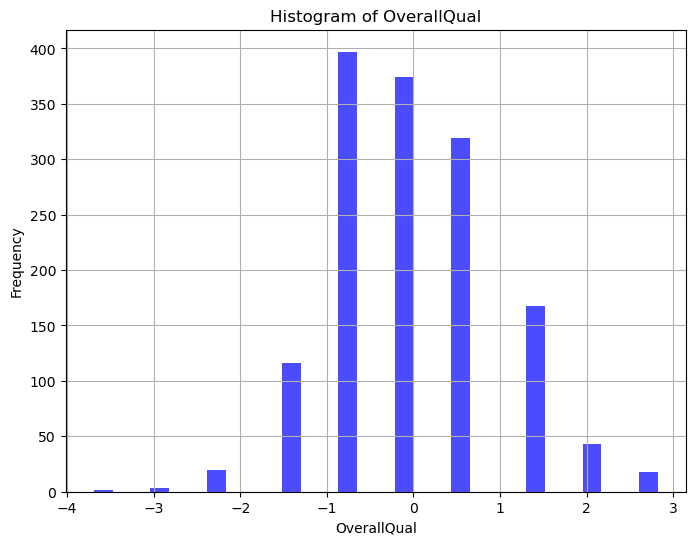

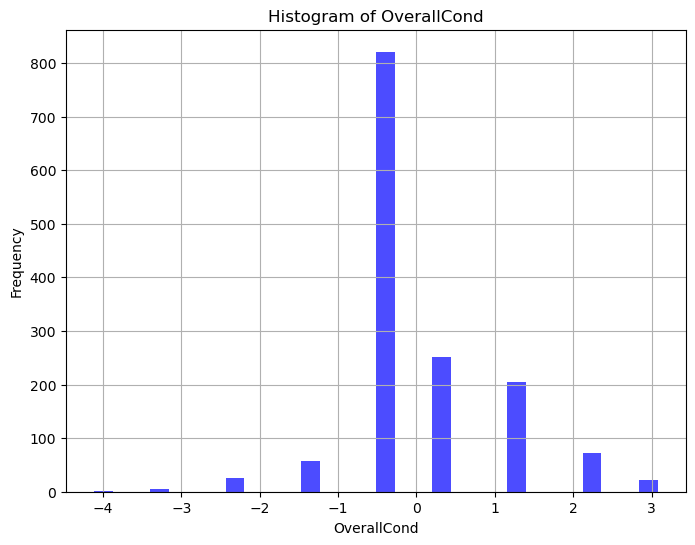

...

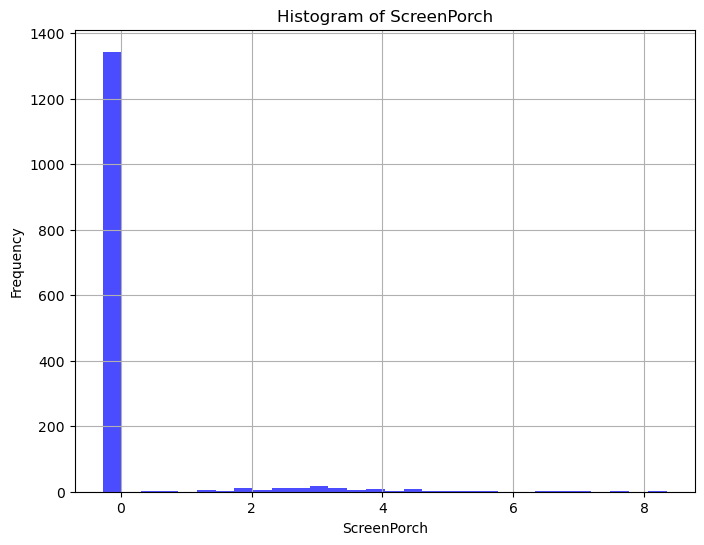

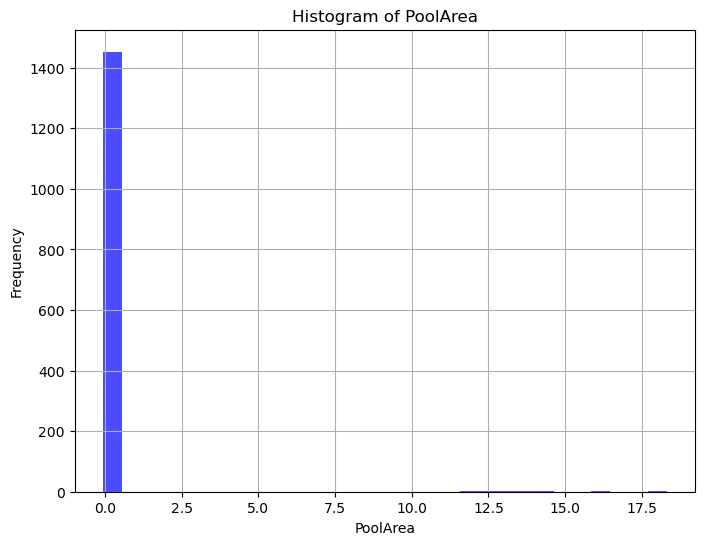

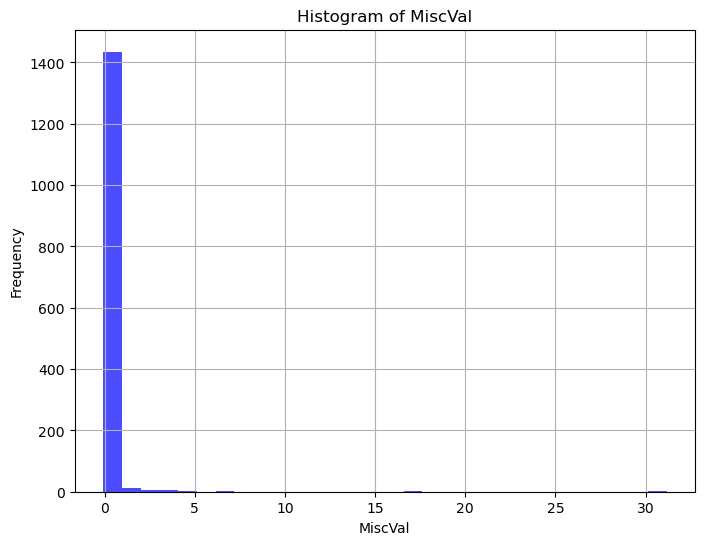

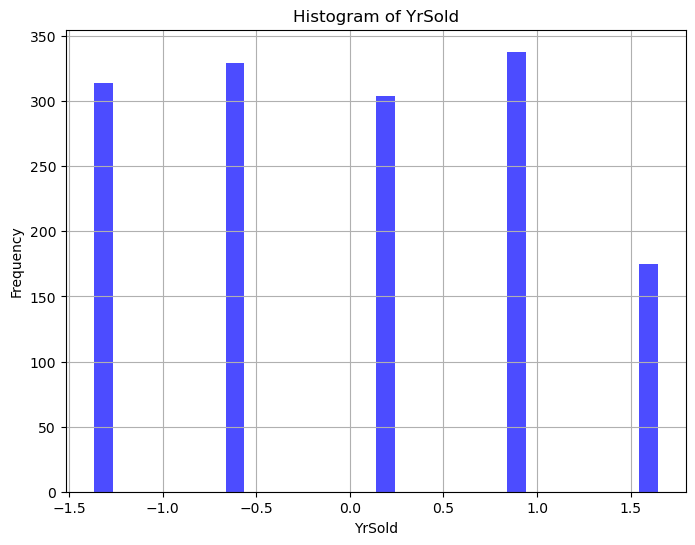

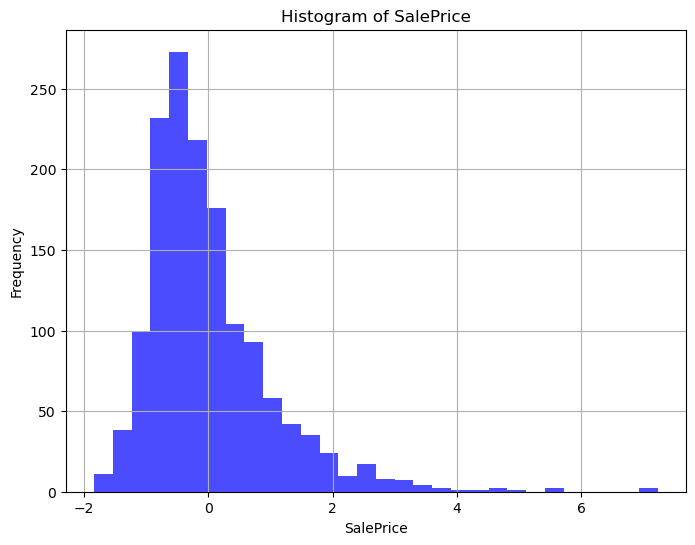

In [18]:
numerical_cols = df.select_dtypes(include=['int64', 'float64'])

# Plotting histograms for each numerical column
for column in numerical_cols.columns:
    plt.figure(figsize=(8, 6))
    plt.hist(numerical_cols[column], bins=30, color='blue', alpha=0.7)
    plt.title(f'Histogram of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.show()

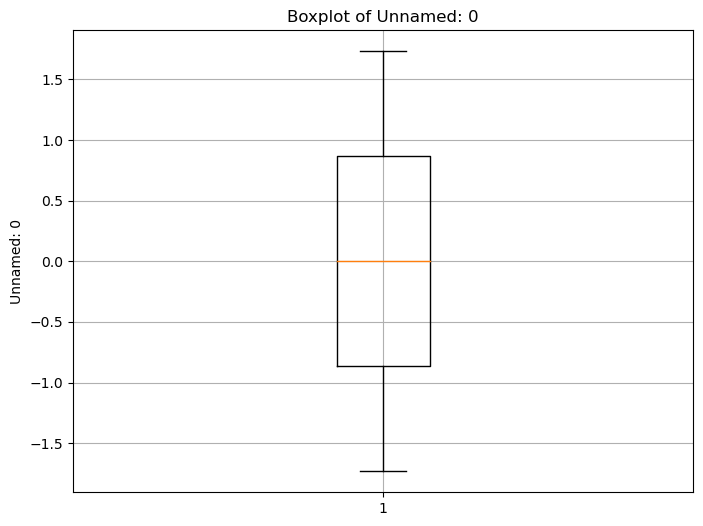

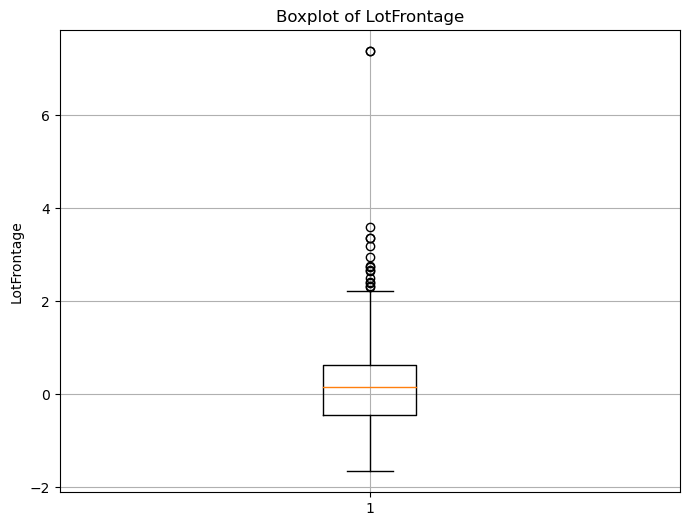

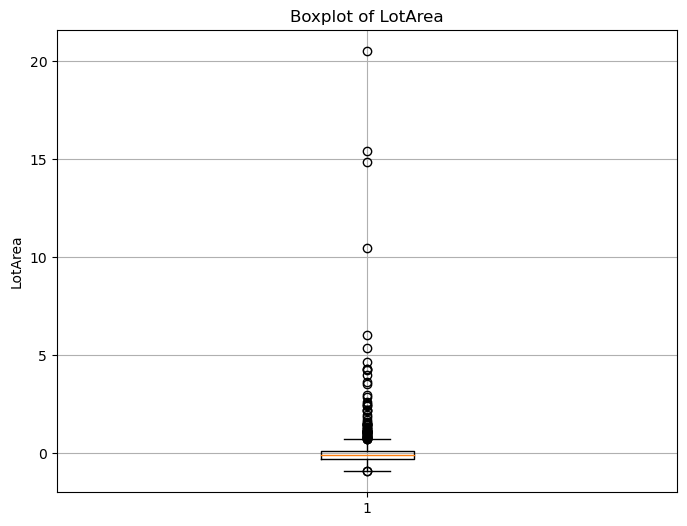

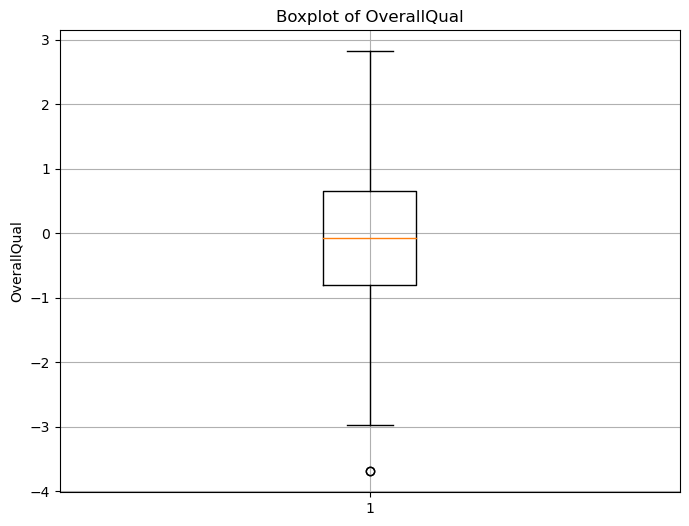

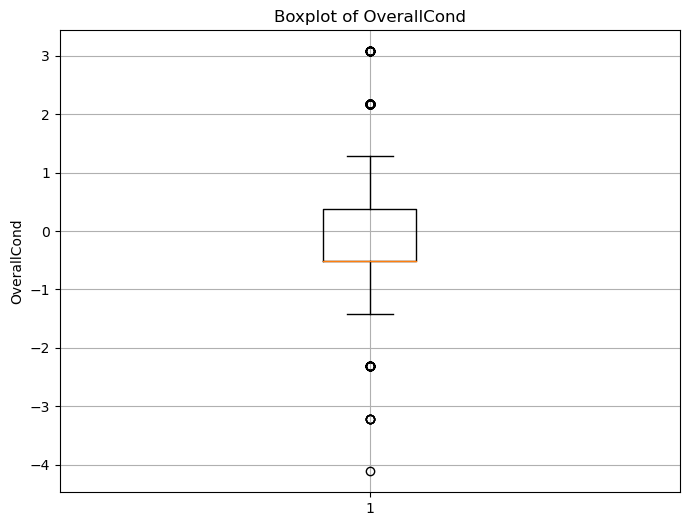

...

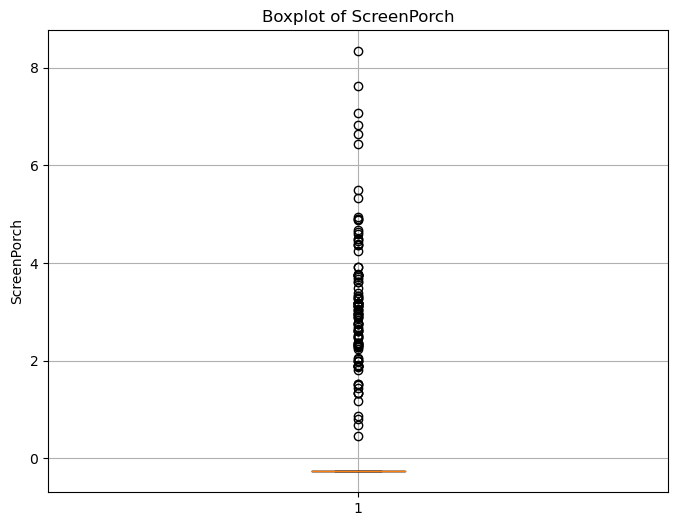

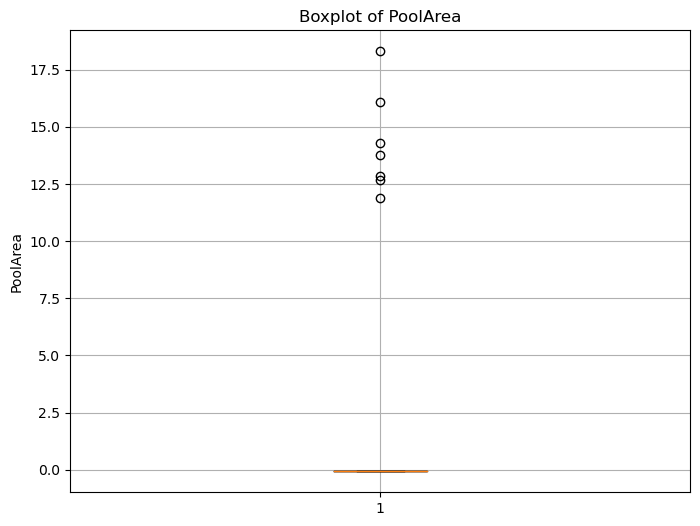

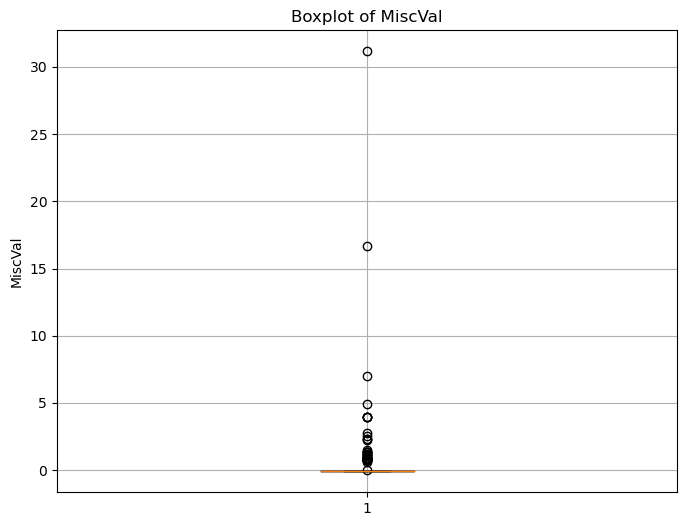

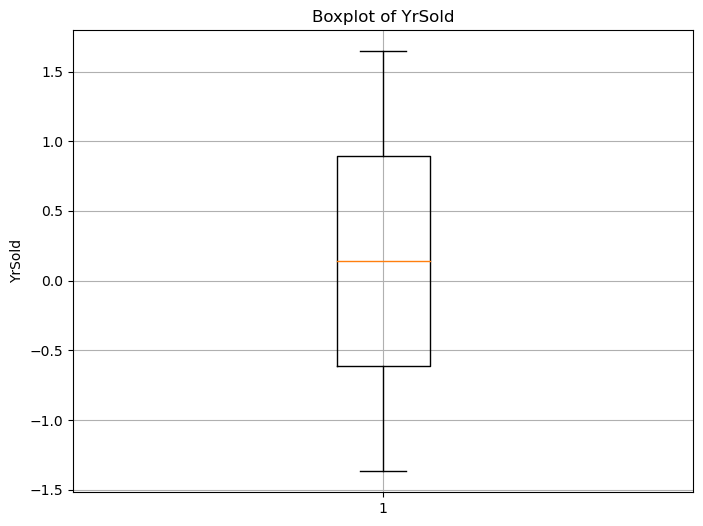

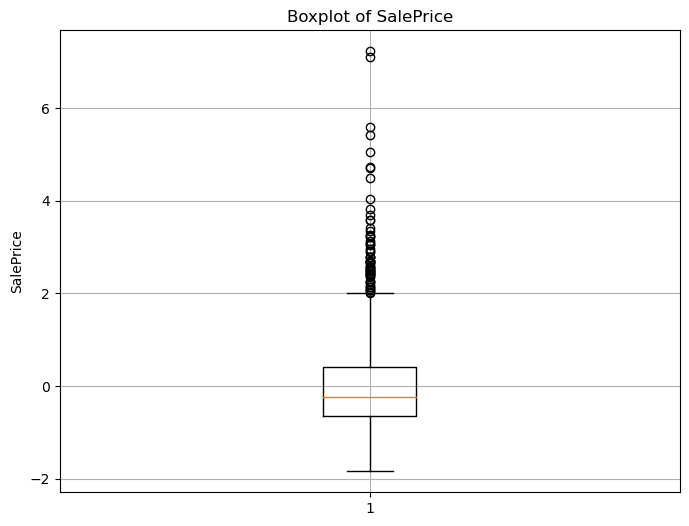

In [19]:
#Boxplot
numerical_cols = df.select_dtypes(include=['int64', 'float64'])

# Plotting boxplots for each numerical column
for column in numerical_cols.columns:
    plt.figure(figsize=(8, 6))
    plt.boxplot(numerical_cols[column])
    plt.title(f'Boxplot of {column}')
    plt.ylabel(column)
    plt.grid(True)
    plt.show()

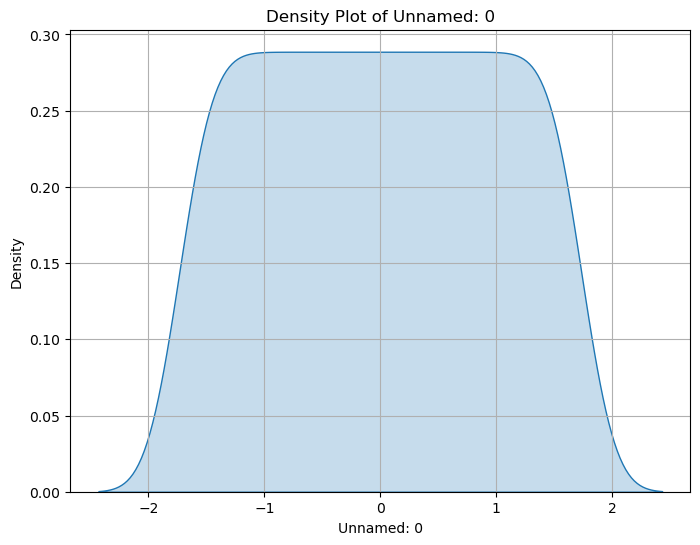

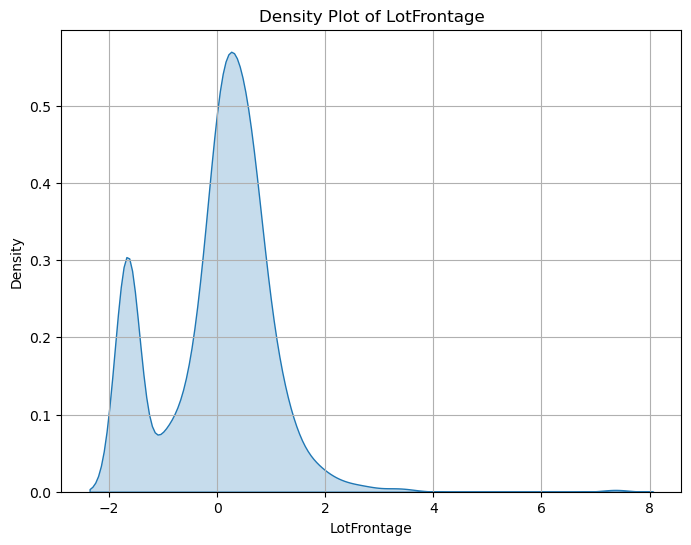

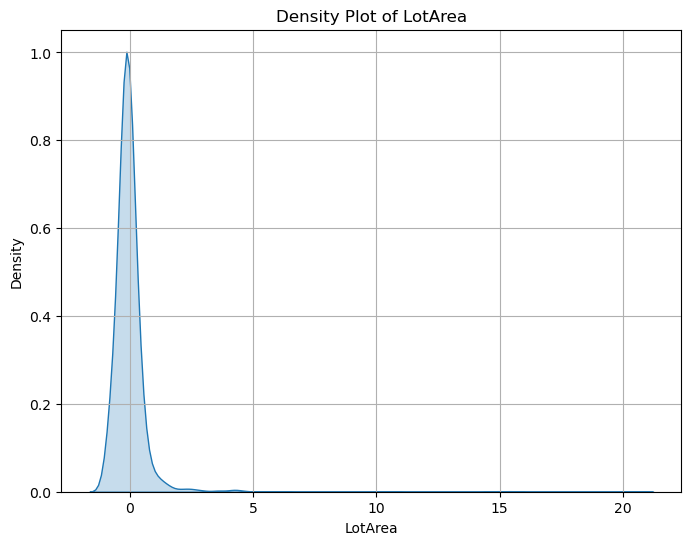

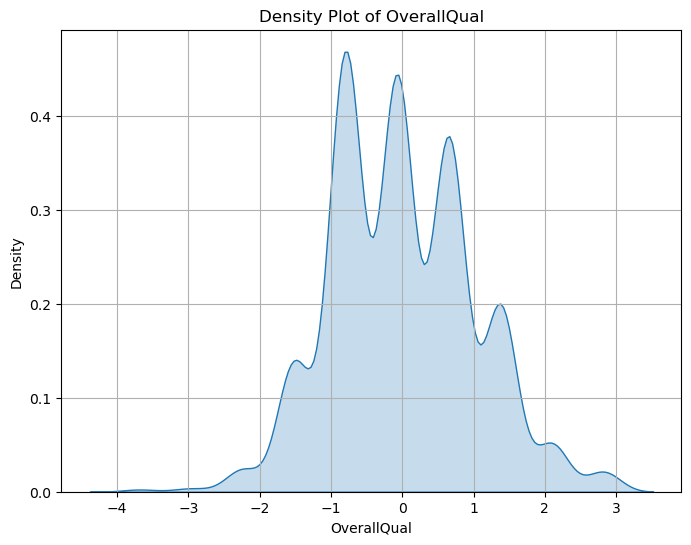

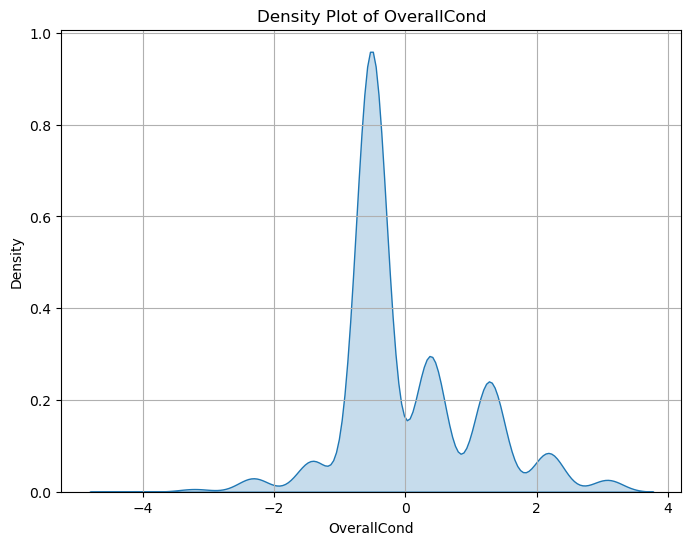

...

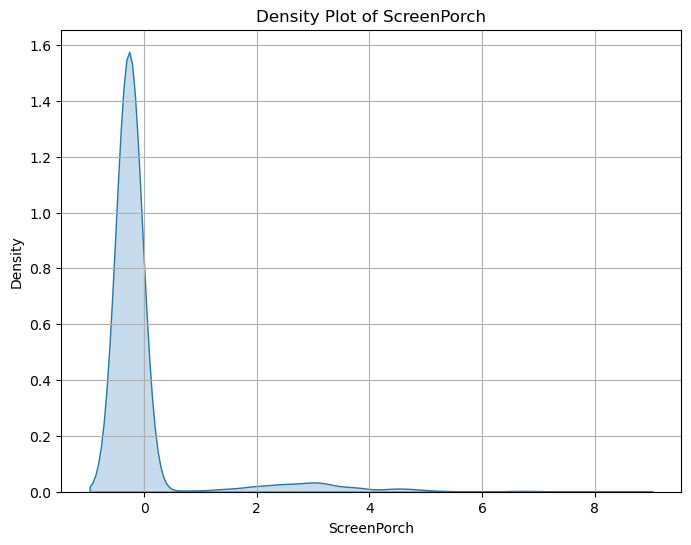

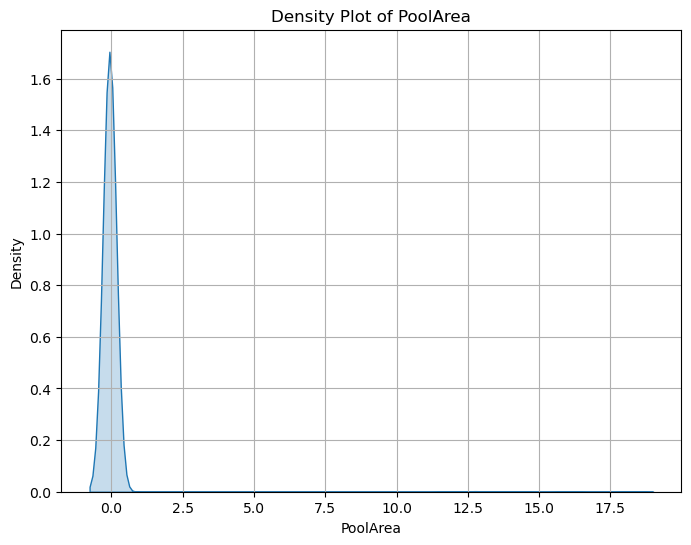

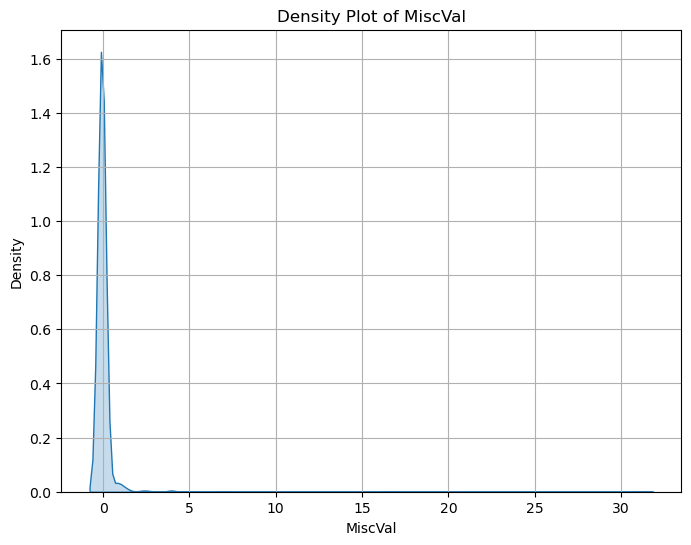

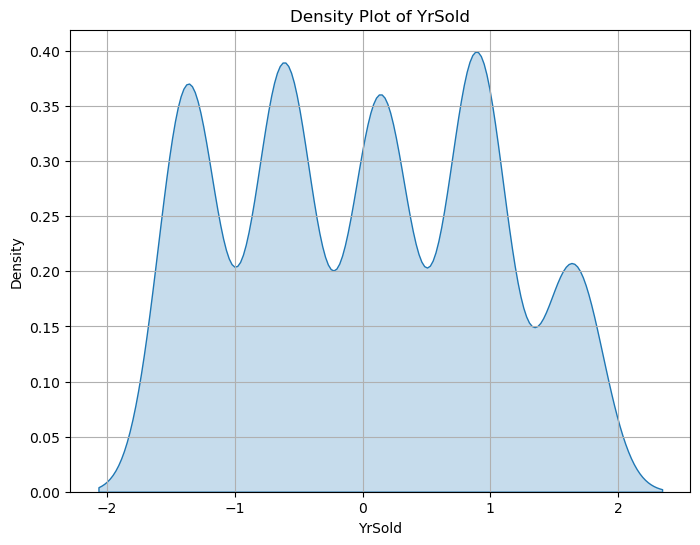

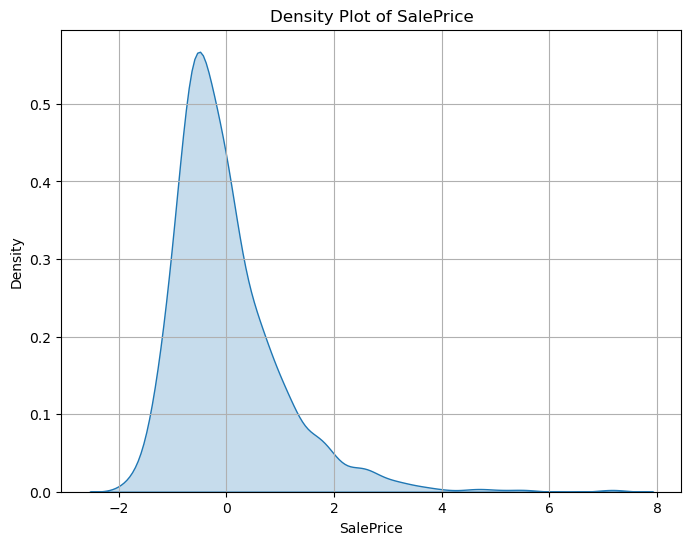

In [55]:
# Density Plot
numerical_columns = df.select_dtypes(include=['int64', 'float64'])

# Plotting density plots for each numerical column
for column in numerical_cols.columns:
    plt.figure(figsize=(8, 6))
    sns.kdeplot(numerical_cols[column], shade=True)
    plt.title(f'Density Plot of {column}')
    plt.xlabel(column)
    plt.ylabel('Density')
    plt.grid(True)
    plt.show()

In [56]:
numerical_columns = df.select_dtypes(include=['int64', 'float64'])

# Creating scatter plot matrix for numerical columns
sns.pairplot(numerical_columns)
plt.show()b

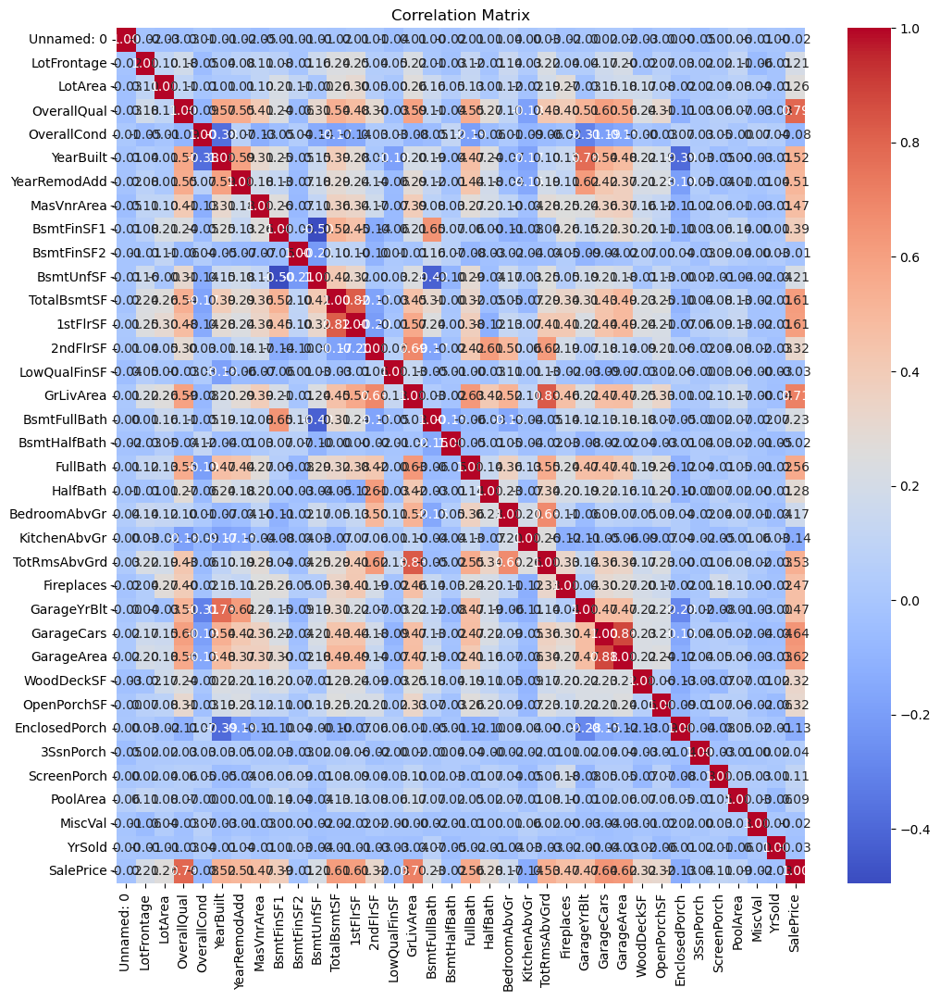

In [57]:
numerical_columns = df.select_dtypes(include=['int64', 'float64'])

# Computing correlation matrix
correlation_matrix = numerical_columns.corr()
plt.figure(figsize=(12, 12))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

In [20]:
df1=pd.read_csv("Cleaned_Data.csv")
df1

,Unnamed: 0,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,0,65,8450,7,5,2003,2003,196,706,0,...,False,False,False,True,False,False,False,False,True,False
1,1,80,9600,6,8,1976,1976,0,978,0,...,False,False,False,True,False,False,False,False,True,False
2,2,68,11250,7,5,2001,2002,162,486,0,...,False,False,False,True,False,False,False,False,True,False
3,3,60,9550,7,5,1915,1970,0,216,0,...,False,False,False,True,True,False,False,False,False,False
4,4,84,14260,8,5,2000,2000,350,655,0,...,False,False,False,True,False,False,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1455,62,7917,6,5,1999,2000,0,0,0,...,False,False,False,True,False,False,False,False,True,False
1456,1456,85,13175,6,6,1978,1988,119,790,163,...,False,False,False,True,False,False,False,False,True,False
1457,1457,66,9042,7,9,1941,2006,0,275,0,...,False,False,False,True,False,False,False,False,True,False
1458,1458,68,9717,5,6,1950,1996,0,49,1029,...,False,False,False,True,False,False,False,False,True,False


In [21]:
df1['TotalSF'] = df1['TotalBsmtSF'] + df1['1stFlrSF'] + df1['2ndFlrSF']
df1['TotalSF']

0       2566
1       2524
2       2706
3       2473
4       3343
        ... 
1455    2600
1456    3615
1457    3492
1458    2156
1459    2512
Name: TotalSF, Length: 1460, dtype: int64

In [22]:
df1['TotalBathrooms'] = (df1['FullBath'] + (0.5 * df1['HalfBath']) +
                        df1['BsmtFullBath'] + (0.5 * df1['BsmtHalfBath']))

In [23]:
df1['TotalBathrooms'] 

0       3.5
1       2.5
2       3.5
3       2.0
4       3.5
       ... 
1455    2.5
1456    3.0
1457    2.0
1458    2.0
1459    2.5
Name: TotalBathrooms, Length: 1460, dtype: float64

In [24]:
df1['Has2ndFloor'] = (df1['2ndFlrSF'] > 0).astype(int)
df1['Has2ndFloor']

0       1
1       0
2       1
3       1
4       1
       ..
1455    1
1456    0
1457    1
1458    0
1459    0
Name: Has2ndFloor, Length: 1460, dtype: int64

In [25]:
df1['Area_x_OverallQual'] = df1['TotalSF'] * df1['OverallQual']
df1['Area_x_OverallQual']

0       17962
1       15144
2       18942
3       17311
4       26744
        ...  
1455    15600
1456    21690
1457    24444
1458    10780
1459    12560
Name: Area_x_OverallQual, Length: 1460, dtype: int64

In [26]:
df1['HouseAge'] = df1['YrSold'] - df1['YearBuilt']
df1['HouseAge']

0        5
1       31
2        7
3       91
4        8
        ..
1455     8
1456    32
1457    69
1458    60
1459    43
Name: HouseAge, Length: 1460, dtype: int64

In [27]:
df1['YearsSinceRemodel'] = df1['YrSold'] - df1['YearRemodAdd']
df1['YearsSinceRemodel']

0        5
1       31
2        6
3       36
4        8
        ..
1455     7
1456    22
1457     4
1458    14
1459    43
Name: YearsSinceRemodel, Length: 1460, dtype: int64

In [58]:
df.to_csv('Enhance_Data.csv', index=False)

In [59]:
print(df1.head())

   Unnamed: 0  LotFrontage  LotArea  OverallQual  OverallCond  YearBuilt  \
0           0           65     8450            7            5       2003   
1           1           80     9600            6            8       1976   
2           2           68    11250            7            5       2001   
3           3           60     9550            7            5       1915   
4           4           84    14260            8            5       2000   

   YearRemodAdd  MasVnrArea  BsmtFinSF1  BsmtFinSF2  ...  \
0          2003         196         706           0  ...   
1          1976           0         978           0  ...   
2          2002         162         486           0  ...   
3          1970           0         216           0  ...   
4          2000         350         655           0  ...   

   SaleCondition_Alloca  SaleCondition_Family  SaleCondition_Normal  \
0                 False                 False                  True   
1                 False                 

In [73]:
df2=pd.read_csv("enhanced_data.csv")
df2

,Unnamed: 0,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,TotalBathrooms,TotalPorchSF,Has2ndFloor,HasGarage,HasBasement,HasFireplace,Area_x_OverallQual,LogTotalSF,HouseAge,YearsSinceRemodel
0,0,65,8450,7,5,2003,2003,196,706,0,...,3.5,61,1,1,1,0,17962,7.850493,5,5
1,1,80,9600,6,8,1976,1976,0,978,0,...,2.5,0,0,1,1,1,15144,7.833996,31,31
2,2,68,11250,7,5,2001,2002,162,486,0,...,3.5,42,1,1,1,1,18942,7.903596,7,6
3,3,60,9550,7,5,1915,1970,0,216,0,...,2.0,307,1,1,1,1,17311,7.813592,91,36
4,4,84,14260,8,5,2000,2000,350,655,0,...,3.5,84,1,1,1,1,26744,8.114923,8,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1425,1455,62,7917,6,5,1999,2000,0,0,0,...,2.5,40,1,1,1,1,15600,7.863651,8,7
1426,1456,85,13175,6,6,1978,1988,119,790,163,...,3.0,0,0,1,1,1,21690,8.193124,32,22
1427,1457,66,9042,7,9,1941,2006,0,275,0,...,2.0,60,1,1,1,1,24444,8.158516,69,4
1428,1458,68,9717,5,6,1950,1996,0,49,1029,...,2.0,112,0,1,1,0,10780,7.676474,60,14


In [74]:
df2 = df2[df['YrSold'] != "0"]
df2

,Unnamed: 0,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,TotalBathrooms,TotalPorchSF,Has2ndFloor,HasGarage,HasBasement,HasFireplace,Area_x_OverallQual,LogTotalSF,HouseAge,YearsSinceRemodel
0,0,65,8450,7,5,2003,2003,196,706,0,...,3.5,61,1,1,1,0,17962,7.850493,5,5
1,1,80,9600,6,8,1976,1976,0,978,0,...,2.5,0,0,1,1,1,15144,7.833996,31,31
2,2,68,11250,7,5,2001,2002,162,486,0,...,3.5,42,1,1,1,1,18942,7.903596,7,6
3,3,60,9550,7,5,1915,1970,0,216,0,...,2.0,307,1,1,1,1,17311,7.813592,91,36
4,4,84,14260,8,5,2000,2000,350,655,0,...,3.5,84,1,1,1,1,26744,8.114923,8,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1425,1455,62,7917,6,5,1999,2000,0,0,0,...,2.5,40,1,1,1,1,15600,7.863651,8,7
1426,1456,85,13175,6,6,1978,1988,119,790,163,...,3.0,0,0,1,1,1,21690,8.193124,32,22
1427,1457,66,9042,7,9,1941,2006,0,275,0,...,2.0,60,1,1,1,1,24444,8.158516,69,4
1428,1458,68,9717,5,6,1950,1996,0,49,1029,...,2.0,112,0,1,1,0,10780,7.676474,60,14


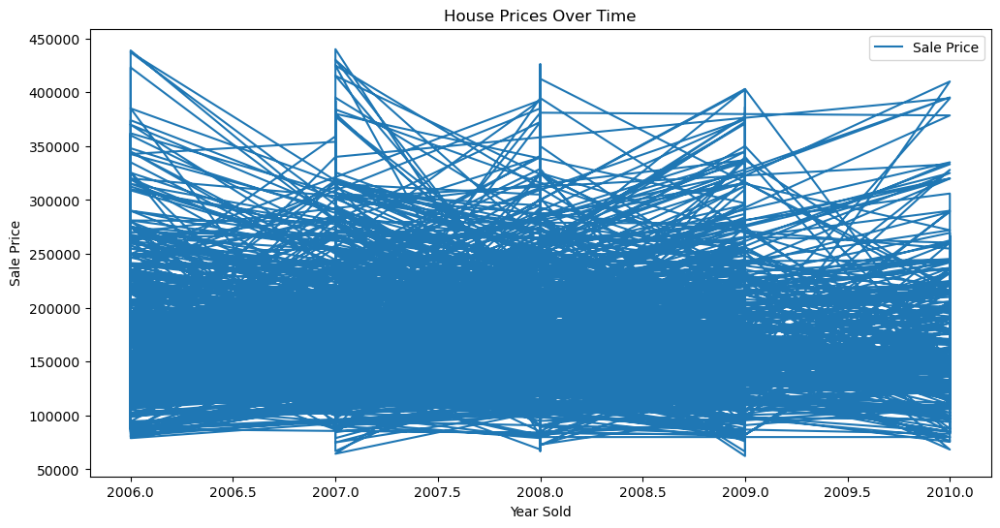

In [75]:
plt.figure(figsize=(12, 6))
plt.plot(df2['YrSold'], df2['SalePrice'], label='Sale Price')
plt.xlabel('Year Sold')
plt.ylabel('Sale Price')
plt.title('House Prices Over Time')
plt.legend()
plt.show()

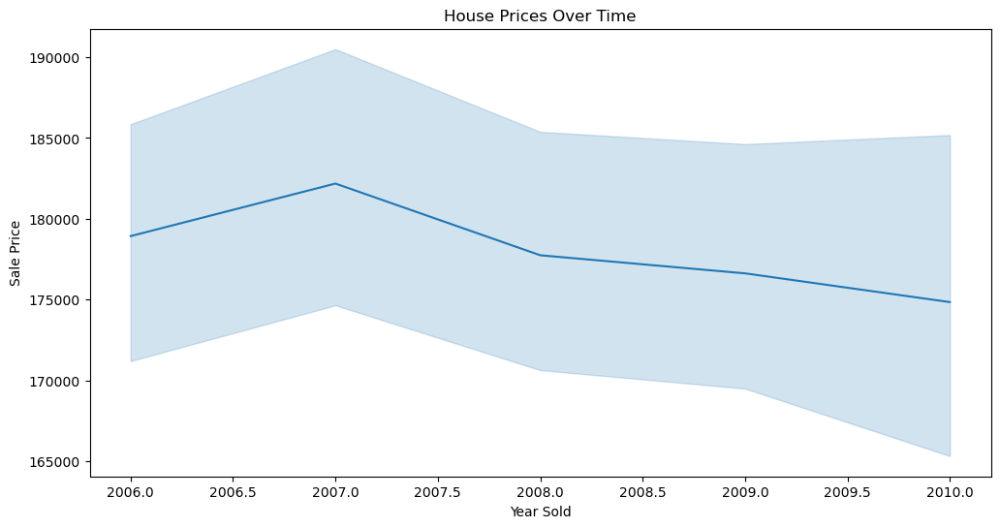

In [76]:
plt.figure(figsize=(12, 6))
sns.lineplot(x='YrSold', y='SalePrice', data=df2)
plt.xlabel('Year Sold')
plt.ylabel('Sale Price')
plt.title('House Prices Over Time')
plt.show()

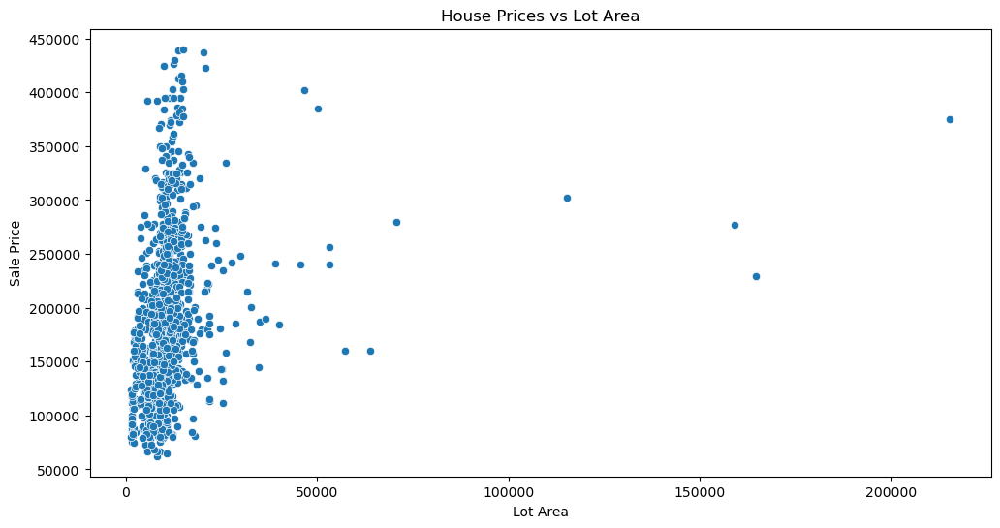

In [77]:
# Scatter plot of house prices vs. LotArea
plt.figure(figsize=(12, 6))
sns.scatterplot(x='LotArea', y='SalePrice', data=df2)
plt.xlabel('Lot Area')
plt.ylabel('Sale Price')
plt.title('House Prices vs Lot Area')
plt.show()

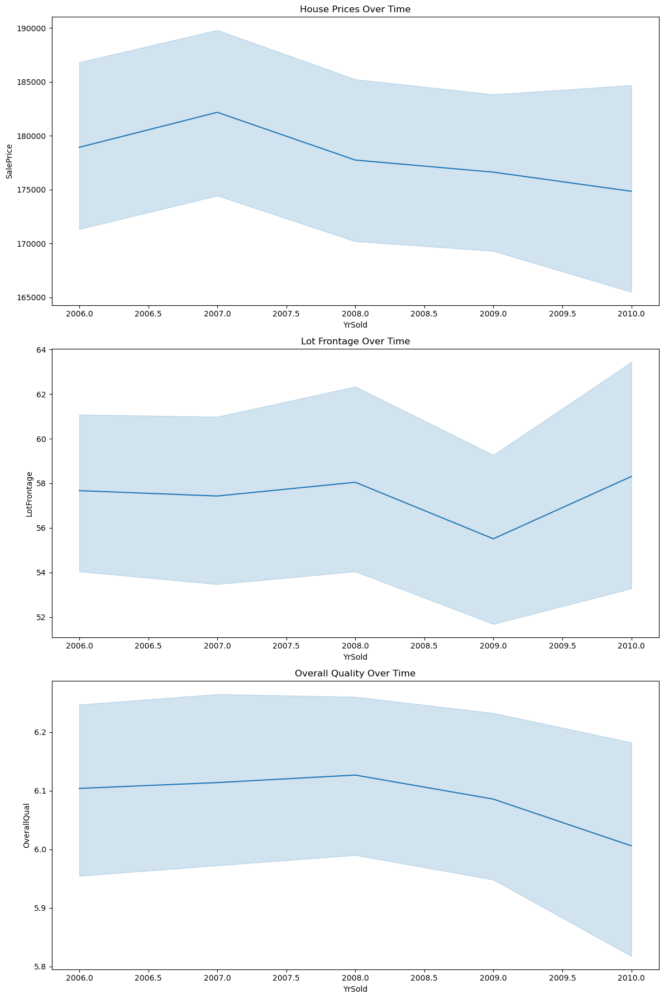

In [78]:
fig, ax = plt.subplots(3, 1, figsize=(12, 18))

# House Prices over time
sns.lineplot(x='YrSold', y='SalePrice', data=df2, ax=ax[0])
ax[0].set_title('House Prices Over Time')

# Lot Frontage over time
sns.lineplot(x='YrSold', y='LotFrontage', data=df2, ax=ax[1])
ax[1].set_title('Lot Frontage Over Time')

# Overall Quality over time
sns.lineplot(x='YrSold', y='OverallQual', data=df2, ax=ax[2])
ax[2].set_title('Overall Quality Over Time')

plt.tight_layout()
plt.show()

In [79]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

In [80]:
X = df[['LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal']]  # Example features
y = df['SalePrice']

In [81]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [82]:
model = LinearRegression()

# Train the model
model.fit(X_train, y_train)

LinearRegression()

In [83]:
y_pred = model.predict(X_test)

# Calculate performance metrics
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")

Mean Squared Error: 0.21327758890618811
R-squared: 0.824636315732699


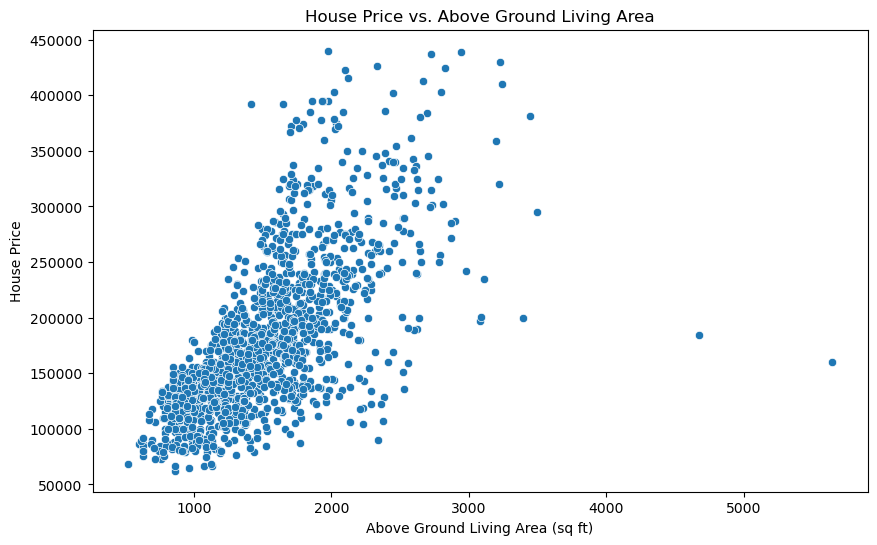

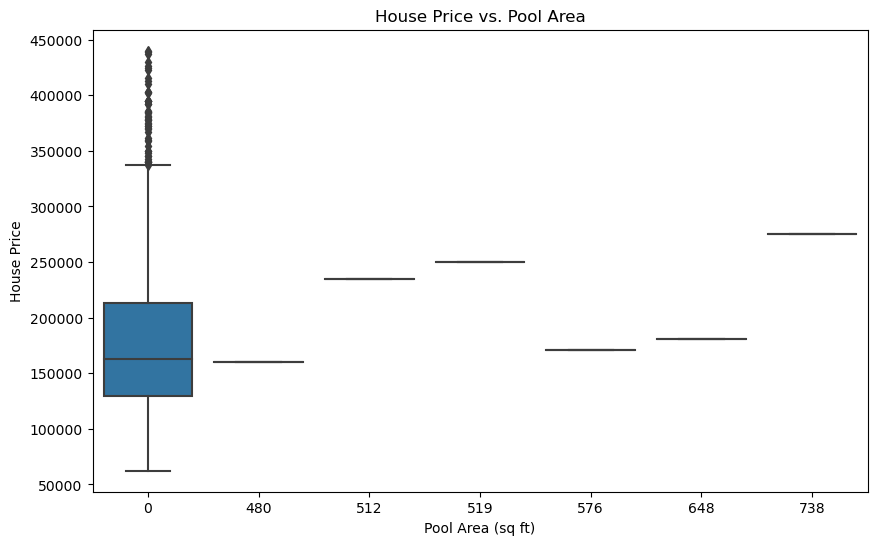

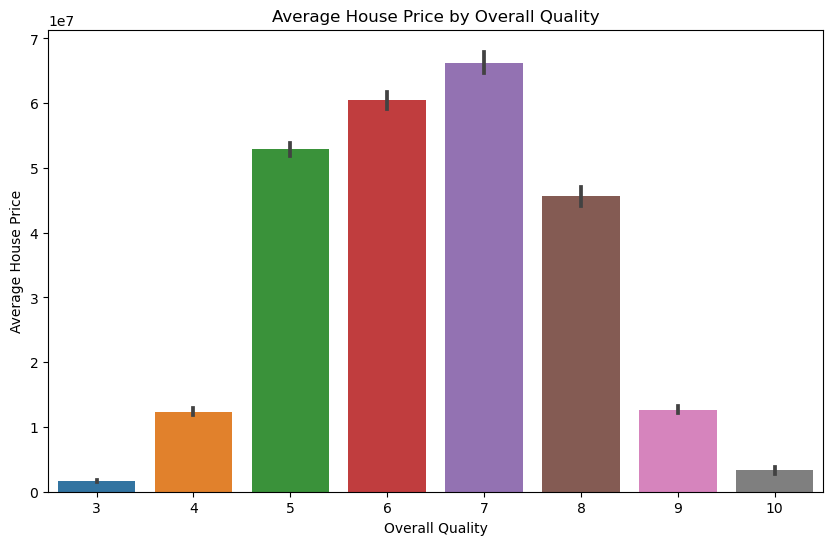

In [84]:
# Scatter plot to see the relationship between square footage and house price
plt.figure(figsize=(10, 6))
sns.scatterplot(x='GrLivArea', y='SalePrice', data=df2)
plt.title('House Price vs. Above Ground Living Area')
plt.xlabel('Above Ground Living Area (sq ft)')
plt.ylabel('House Price')
plt.show()

# Box plot to see how the presence of a swimming pool impacts house prices
plt.figure(figsize=(10, 6))
sns.boxplot(x='PoolArea', y='SalePrice', data=df2)
plt.title('House Price vs. Pool Area')
plt.xlabel('Pool Area (sq ft)')
plt.ylabel('House Price')
plt.show()

# Bar plot to see the average house price by overall quality
plt.figure(figsize=(10, 6))
sns.barplot(x='OverallQual', y='SalePrice', data=df2, estimator=sum)
plt.title('Average House Price by Overall Quality')
plt.xlabel('Overall Quality')
plt.ylabel('Average House Price')
plt.show()

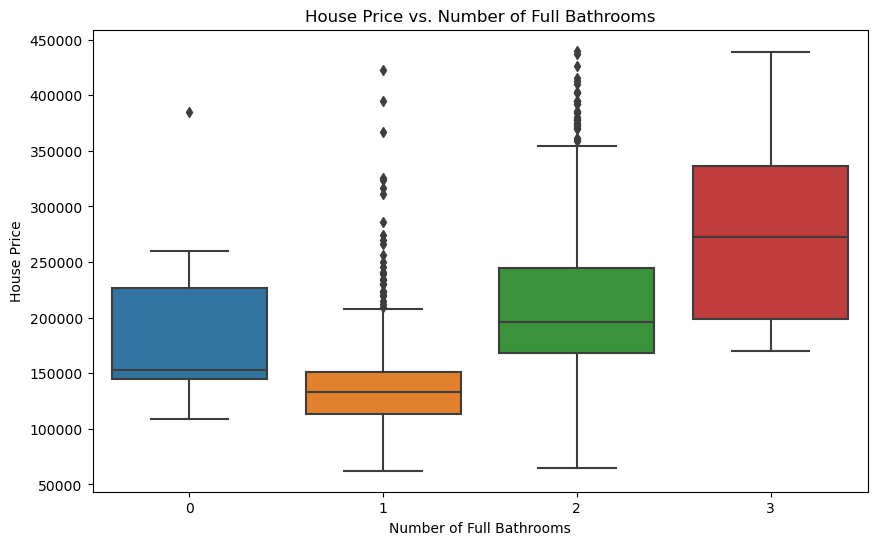

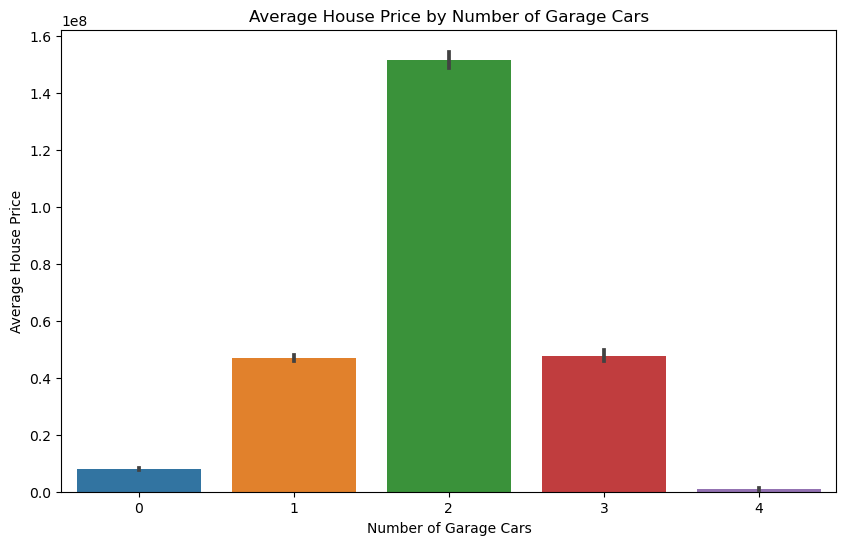

In [85]:
# Box plot for number of bathrooms
plt.figure(figsize=(10, 6))
sns.boxplot(x='FullBath', y='SalePrice', data=df2)
plt.title('House Price vs. Number of Full Bathrooms')
plt.xlabel('Number of Full Bathrooms')
plt.ylabel('House Price')
plt.show()

# Bar plot for the presence of a garage
plt.figure(figsize=(10, 6))
sns.barplot(x='GarageCars', y='SalePrice', data=df2, estimator=sum)
plt.title('Average House Price by Number of Garage Cars')
plt.xlabel('Number of Garage Cars')
plt.ylabel('Average House Price')
plt.show()